In [2]:
from google.colab import auth
auth.authenticate_user()

from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [3]:
!ls

adc.json  gdrive  sample_data


In [4]:
!pip install tensorboardcolab
from tensorboardcolab import TensorBoardColab, TensorBoardColabCallback

tbc=TensorBoardColab()

Using TensorFlow backend.


Wait for 8 seconds...
TensorBoard link:
https://8d7e7219.ngrok.io


In [0]:
import os
os.chdir("gdrive/My Drive/Colab Notebooks")

In [6]:
# Enable this for some more verbose info.
debugging = True
#import tensorflow as tf
from keras import backend as K
K.clear_session()

W0814 06:00:40.240346 140553877170048 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:95: The name tf.reset_default_graph is deprecated. Please use tf.compat.v1.reset_default_graph instead.

W0814 06:00:40.242201 140553877170048 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:98: The name tf.placeholder_with_default is deprecated. Please use tf.compat.v1.placeholder_with_default instead.

W0814 06:00:40.290389 140553877170048 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:102: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.



#Common imports

In [7]:
import os
import sys
import json
import datetime
import numpy as np
import skimage.draw
import random
import collections

# Root directory of the project
ROOT_DIR = os.path.abspath("./BCI/99 project/Mask_RCNN/")
ROOT_IMAGE_DIR = os.path.abspath("./BCI/99 project/Mask_RCNN/images/")

# Path to the dataset (note this is a shared images directory)
dataset_path = os.path.join(ROOT_IMAGE_DIR, "")

models_dir = os.path.join(ROOT_DIR, "models/")

print("base dataset dir:", dataset_path)
print("base modesl dir:", models_dir)

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn.config import Config
from mrcnn import model as modellib, utils

from mrcnn import visualize
from mrcnn.visualize import display_images
from mrcnn.model import log

# Path to trained weights file
COCO_WEIGHTS_PATH = os.path.join(models_dir, "init_weights/mask_rcnn_coco.h5")

# Directory to save logs and model checkpoints, if not provided
# through the command line argument --logs
DEFAULT_LOGS_DIR = os.path.join(ROOT_DIR, "logs")

print("init_weights dir: ", COCO_WEIGHTS_PATH)

base dataset dir: /content/gdrive/My Drive/Colab Notebooks/BCI/99 project/Mask_RCNN/images/
base modesl dir: /content/gdrive/My Drive/Colab Notebooks/BCI/99 project/Mask_RCNN/models/
init_weights dir:  /content/gdrive/My Drive/Colab Notebooks/BCI/99 project/Mask_RCNN/models/init_weights/mask_rcnn_coco.h5


In [0]:
# for visualization
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.lines as lines
from matplotlib.patches import Polygon

%matplotlib inline

In [0]:
# For Config and Dataset 
sys.path.append(os.path.join(ROOT_DIR, ""))  # To find local version
import det as det

In [10]:
%%time

# For debugging...
if debugging:
    # Load annotations
    print(dataset_path)
    annotations = json.load(open(os.path.join(dataset_path, "all_data/annotations.json")))
    annotations = list(annotations.values())  # don't need the dict keys

    # The VIA tool saves images in the JSON even if they don't have any
    # annotations. Skip unannotated images.
    annotations = [a for a in annotations if a['regions']]

    for a in annotations:
        print(a['filename'])

/content/gdrive/My Drive/Colab Notebooks/BCI/99 project/Mask_RCNN/images/
boob_1.jpg
boob_2.jpg
boob_3.jpg
boob_4.jpg
boob_5.jpg
boob_6.jpg
boob_7.jpg
boob_8.jpg
boob_9.jpg
boob_10.jpg
boob_11.jpg
boob_12.jpg
boob_13.jpg
boob_14.jpg
boob_15.jpg
boob_16.jpg
boob_17.jpg
boob_18.jpg
boob_19.jpg
boob_20.jpg
boob_21.jpg
boob_22.jpg
boob_23.jpg
boob_24.jpg
boob_25.jpg
boob_26.jpg
boob_27.jpg
boob_28.jpg
boob_29.jpg
boob_30.jpg
boob_31.jpg
boob_32.jpg
boob_33.jpg
boob_34.jpg
boob_35.jpg
boob_36.jpg
boob_37.jpg
boob_38.jpg
boob_39.jpg
boob_40.jpg
boob_41.jpg
boob_42.jpg
boob_43.jpg
boob_44.jpg
boob_45.jpg
boob_46.jpg
boob_47.jpg
boob_48.jpg
boob_49.jpg
boob_50.jpg
boob_51.jpg
boob_53.jpg
boob_54.jpg
boob_55.jpg
boob_56.jpg
boob_57.jpg
boob_58.jpg
boob_59.jpg
boob_60.jpg
boob_61.jpg
boob_62.jpg
boob_63.jpg
boob_64.jpg
boob_65.jpg
boob_66.jpg
boob_67.jpg
boob_68.jpg
boob_69.jpg
boob_70.jpg
boob_71.jpg
boob_72.jpg
boob_73.jpg
boob_74.jpg
boob_75.jpg
boob_76.jpg
boob_77.jpg
boob_78.jpg
boob_79.jpg

#Configuration

In [0]:
# Create an object to hold configuration
config = det.DetConfig('alcohol', ['alcohol', 'boob', 'cigarette', 'knife' ,'gun'])

#Load dataset

In [12]:
len(annotations)

4732

In [0]:
#json파일 수정
# for a in annotations:
#   for id, region in a['regions'].items():
#     region['region_attributes']['object_name'] = region['region_attributes'].pop('objecte_name')

In [0]:
#json파일 저장
# with open(dataset_path + 'annotations.json', 'w', encoding='utf-8') as make_file:

#     json.dump(annotations, make_file, indent="\t")

In [15]:
# mistake check
for a in annotations:
  for id, region in a['regions'].items():
    t = region['region_attributes']
    s = region['shape_attributes']['name']
    if bool(t.values()) == False or s != 'polygon':
      print(t, a['filename'])
      print(s, a['filename'])

{'object_name': 'boob'} boob_57.jpg
polyline boob_57.jpg
{'object_name': 'boob'} boob_65.jpg
polyline boob_65.jpg
{'object_name': 'boob'} boob_68.jpg
polyline boob_68.jpg
{'object_name': 'boob'} boob_72.jpg
polyline boob_72.jpg
{'object_name': 'boob'} boob_93.jpg
polyline boob_93.jpg
{'object_name': 'boob'} boob_105.jpg
polyline boob_105.jpg
{'object_name': 'boob'} boob_143.jpg
polyline boob_143.jpg
{'object_name': 'boob'} boob_235.JPG
polyline boob_235.JPG
{'object_name': 'boob'} boob_255.jpg
polyline boob_255.jpg
{'object_name': 'boob'} boob_300.jpg
polyline boob_300.jpg
{'object_name': 'boob'} boob_317.jpg
polyline boob_317.jpg
{'object_name': 'boob'} boob_324.jpg
polyline boob_324.jpg
{'object_name': 'boob'} boob_345.jpg
polyline boob_345.jpg
{'object_name': 'boob'} boob_349.jpg
polyline boob_349.jpg
{'object_name': 'boob'} boob_361.jpg
polyline boob_361.jpg
{'object_name': 'boob'} boob_377.jpg
polyline boob_377.jpg
{'object_name': 'boob'} boob_411.jpg
polyline boob_411.jpg
{'objec

In [16]:
%%time
# Load dataset
dataset, _ = det.create_datasets(dataset_path+"all_data",  config)

# Must call before using the dataset, amount other things,
# this maps the sources to the class ids.
dataset.prepare()

# Print a summary of the dataset and classes
print("Image Count: {}".format(len(dataset.image_ids)))
print("Class Count: {}".format(dataset.num_classes))
for i, info in enumerate(dataset.class_info):
    print("{:3}. {:50}".format(i, info['name']))

Counter({'alcohol': 1482, 'gun': 1049, 'knife': 850, 'cigarette': 774, 'boob': 664})
Counter({'alcohol': 347, 'gun': 261, 'knife': 210, 'cigarette': 189, 'boob': 167})
Adding class   1:alcohol
Adding class   2:boob
Adding class   3:cigarette
Adding class   4:knife
Adding class   5:gun


/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 4718592 bytes but only got 0. Skipping tag 0
  " Skipping tag %s" % (size, len(data), tag))
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 19660800 bytes but only got 0. Skipping tag 0
  " Skipping tag %s" % (size, len(data), tag))
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 9175040 bytes but only got 0. Skipping tag 2
  " Skipping tag %s" % (size, len(data), tag))
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 2883584 bytes but only got 0. Skipping tag 2
  " Skipping tag %s" % (size, len(data), tag))
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to r

Adding class   1:alcohol
Adding class   2:boob
Adding class   3:cigarette
Adding class   4:knife
Adding class   5:gun
Image Count: 3782
Class Count: 6
  0. BG                                                
  1. alcohol                                           
  2. boob                                              
  3. cigarette                                         
  4. knife                                             
  5. gun                                               
CPU times: user 58.5 s, sys: 3 s, total: 1min 1s
Wall time: 1min 16s


#Display Samples

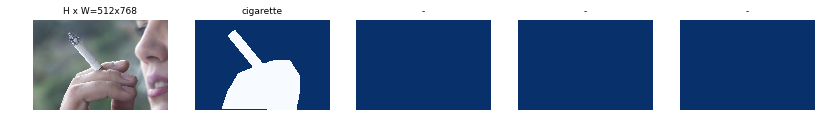

(512, 768, 1)

In [17]:
image_id = 100
image = dataset.load_image(image_id)
mask, class_ids = dataset.load_mask(image_id)
visualize.display_top_masks(image, mask, class_ids, dataset.class_names)
mask.shape

In [0]:
#수정 후 최초 1회 시행시 debugging = True
debugging = False

if debugging:
    for image_id in dataset.image_ids:
        print("image_id: ", image_id)
        image = dataset.load_image(image_id)
        mask, class_ids = dataset.load_mask(image_id)
        visualize.display_top_masks(image, mask, class_ids, dataset.class_names)
        mask.shape
        
if debugging == False : 
  debugging = True

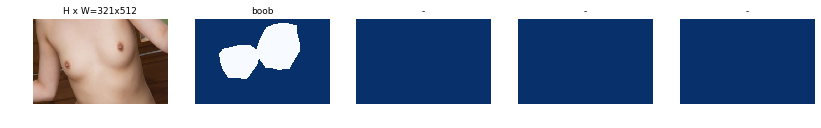

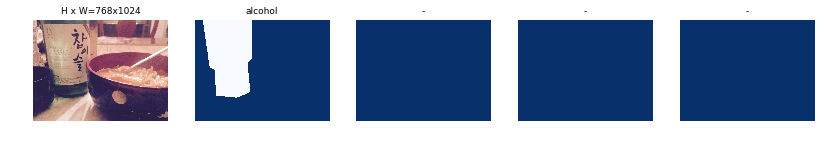

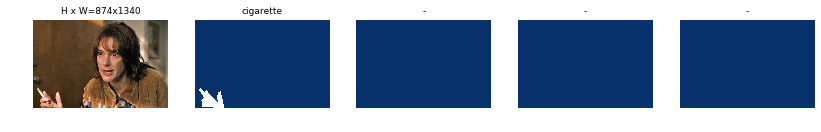

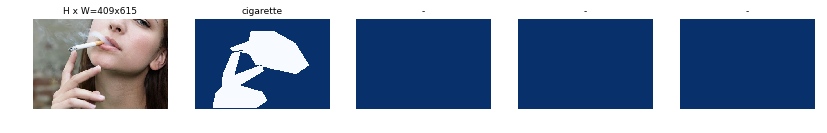

In [19]:
from mrcnn import visualize
from mrcnn.visualize import display_images

# Load and display random samples
image_ids = np.random.choice(dataset.image_ids, 4)
for image_id in image_ids:
    image = dataset.load_image(image_id)
    mask, class_ids = dataset.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, dataset.class_names)

#Bounding boxes

image_id  1185 /content/gdrive/My Drive/Colab Notebooks/BCI/99 project/Mask_RCNN/images/all_data/boob_266.jpg
image                    shape: (173, 291, 3)         min:    0.00000  max:  255.00000  uint8
mask                     shape: (173, 291, 1)         min:    0.00000  max:    1.00000  bool
class_ids                shape: (1,)                  min:    2.00000  max:    2.00000  int32
bbox                     shape: (1, 4)                min:   59.00000  max:  167.00000  int32


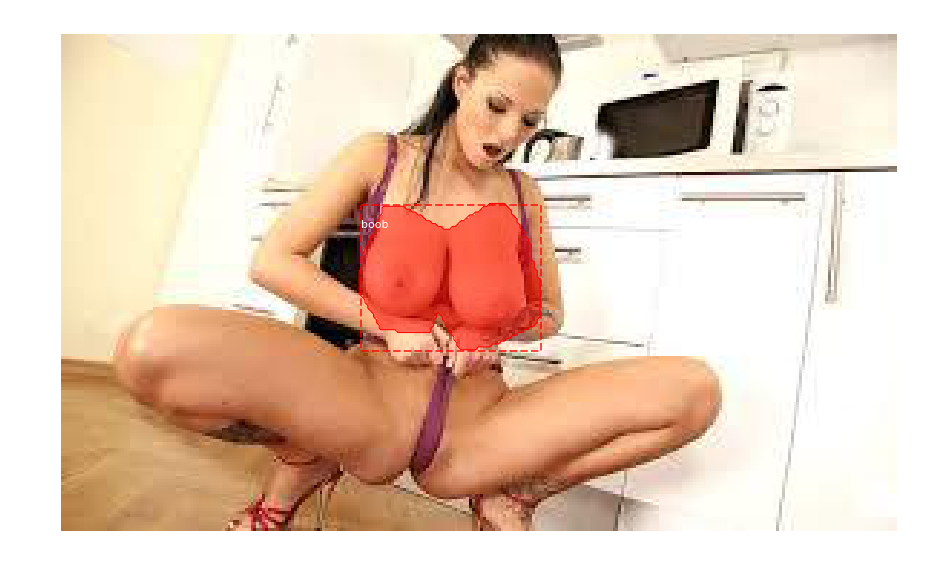

In [20]:
# Load random image and mask.
image_id = random.choice(dataset.image_ids)

image = dataset.load_image(image_id)
mask, class_ids = dataset.load_mask(image_id)
# Compute Bounding box
bbox = utils.extract_bboxes(mask)

type(mask)

# Display image and additional stats
print("image_id ", image_id, dataset.image_reference(image_id))
log("image", image)
log("mask", mask)
log("class_ids", class_ids)
log("bbox", bbox)
# Display image and instances
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

#Prepare images

image_id:  3293 /content/gdrive/My Drive/Colab Notebooks/BCI/99 project/Mask_RCNN/images/all_data/knife_0863.jpg
Original shape:  (750, 1334, 3)
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
mask                     shape: (1024, 1024, 2)       min:    0.00000  max:    1.00000  bool
class_ids                shape: (2,)                  min:    4.00000  max:    4.00000  int32
bbox                     shape: (2, 4)                min:  129.00000  max:  451.00000  int32


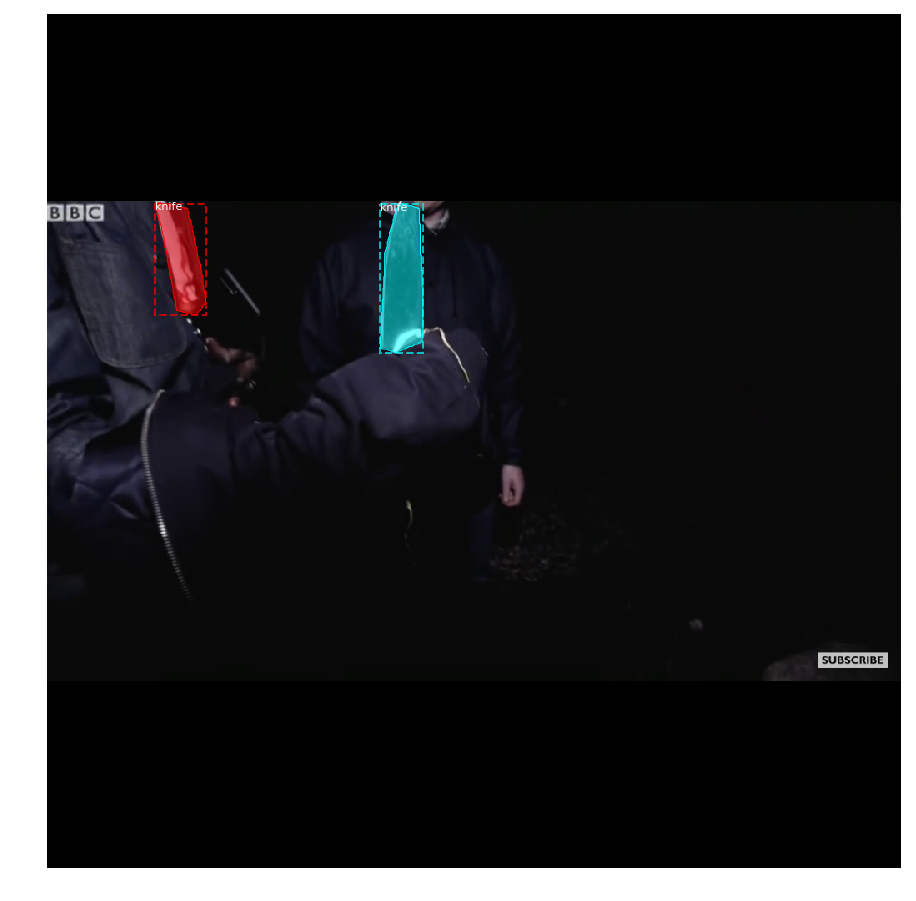

In [21]:
# Load random image and mask.
image_id = np.random.choice(dataset.image_ids, 1)[0]
image = dataset.load_image(image_id)
mask, class_ids = dataset.load_mask(image_id)
original_shape = image.shape
# Resize
image, window, scale, padding, _ = utils.resize_image(
    image, 
    min_dim=config.IMAGE_MIN_DIM, 
    max_dim=config.IMAGE_MAX_DIM,
    mode=config.IMAGE_RESIZE_MODE)
mask = utils.resize_mask(mask, scale, padding)
# Compute Bounding box
bbox = utils.extract_bboxes(mask)

# Display image and additional stats
print("image_id: ", image_id, dataset.image_reference(image_id))
print("Original shape: ", original_shape)
log("image", image)
log("mask", mask)

log("class_ids", class_ids)
log("bbox", bbox)
# Display image and instances
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

#Mini Masks

image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
image_meta               shape: (18,)                 min:    0.00000  max: 1024.00000  float64
class_ids                shape: (1,)                  min:    3.00000  max:    3.00000  int32
bbox                     shape: (1, 4)                min:  159.00000  max: 1014.00000  int32
mask                     shape: (1024, 1024, 1)       min:    0.00000  max:    1.00000  bool


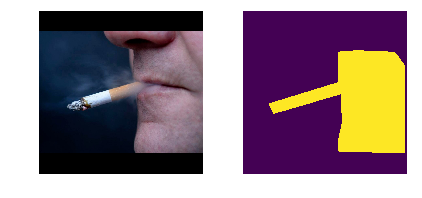

In [22]:
image_id = np.random.choice(dataset.image_ids, 1)[0]
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
    dataset, config, image_id, use_mini_mask=False)

log("image", image)
log("image_meta", image_meta)
log("class_ids", class_ids)
log("bbox", bbox)
log("mask", mask)

display_images([image]+[mask[:,:,i] for i in range(min(mask.shape[-1], 7))])

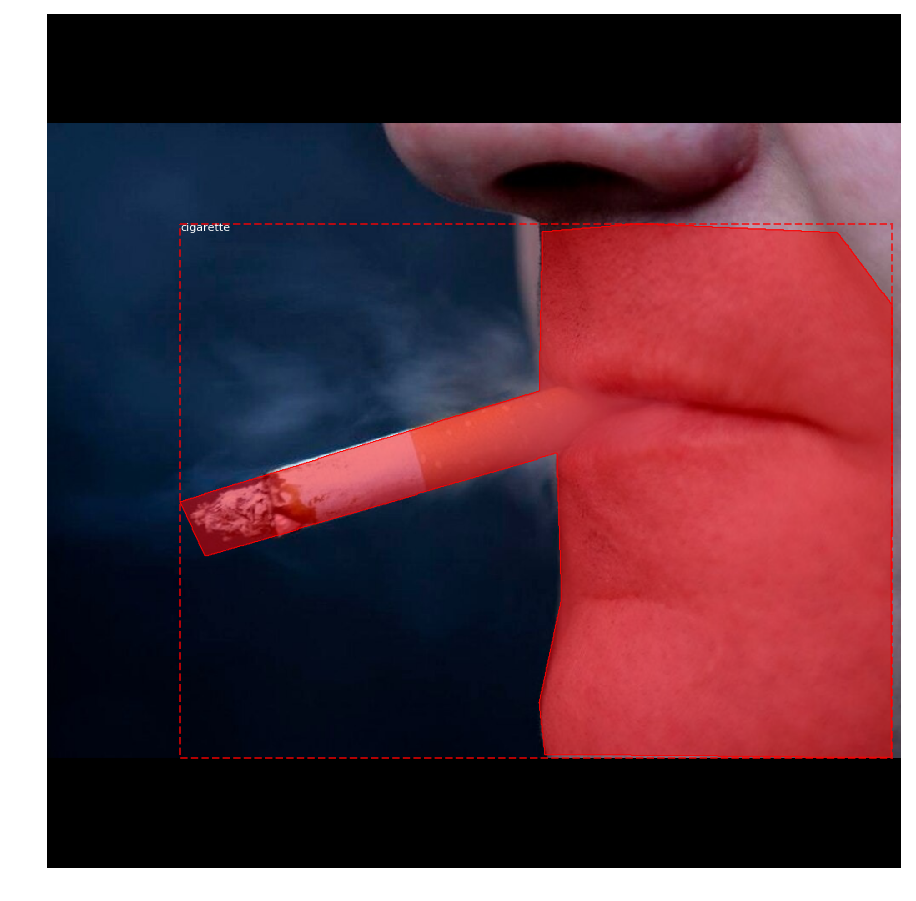

In [23]:
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

#Augmentation

In [0]:
# The imgaug library is pretty flexible and make different types of augmentation possible. 
# The deterministic setting is used because any spatial changes to the image must also be 
# done to the mask. There are also some augmentors that are unsafe to apply. From the mrcnn
# library: 
# Augmentors that are safe to apply to masks: 
# ["Sequential", "SomeOf", "OneOf", "Sometimes","Fliplr", 
# "Flipud", "CropAndPad", "Affine", "PiecewiseAffine"]
# Affine, has settings that are unsafe, so always
# test your augmentation on masks

import imgaug as ia
from imgaug import augmenters as iaa

ia.seed(1)

# http://imgaug.readthedocs.io/en/latest/source/augmenters.html#sequential
seq_of_aug = iaa.Sequential([
    iaa.Crop(percent=(0, 0.1)), # random crops
    
    # horizontally flip 50% of the images
    iaa.Fliplr(0.5), 

    # Gaussian blur to 50% of the images
    # with random sigma between 0 and 0.5.
    iaa.Sometimes(0.5,
        iaa.GaussianBlur(sigma=(0, 0.5))
    ),
    
    # Strengthen or weaken the contrast in each image.
    iaa.ContrastNormalization((0.75, 1.5)),
    
    # Add gaussian noise.
    # For 50% of all images, we sample the noise once per pixel.
    # For the other 50% of all images, we sample the noise per pixel AND
    # channel. This can change the color (not only brightness) of the
    # pixels.
    iaa.AdditiveGaussianNoise(loc=0, scale=(0.0, 0.05*255), per_channel=0.5),
    
    # Make some images brighter and some darker.
    # In 20% of all cases, we sample the multiplier once per channel,
    # which can end up changing the color of the images.
    iaa.Multiply((0.8, 1.2), per_channel=0.2),
    
    # Apply affine transformations to each image.
    # Scale/zoom them from 90% 5o 110%
    # Translate/move them, rotate them
    # Shear them slightly -2 to 2 degrees.
    iaa.Affine(
        scale={"x": (0.9, 1.1), "y": (0.9, 1.1)},
        translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)},
        rotate=(-5, 5),
        shear=(-2, 2)
    )
], random_order=True) # apply augmenters in random order

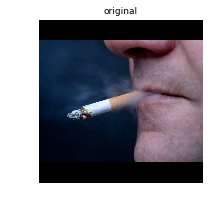

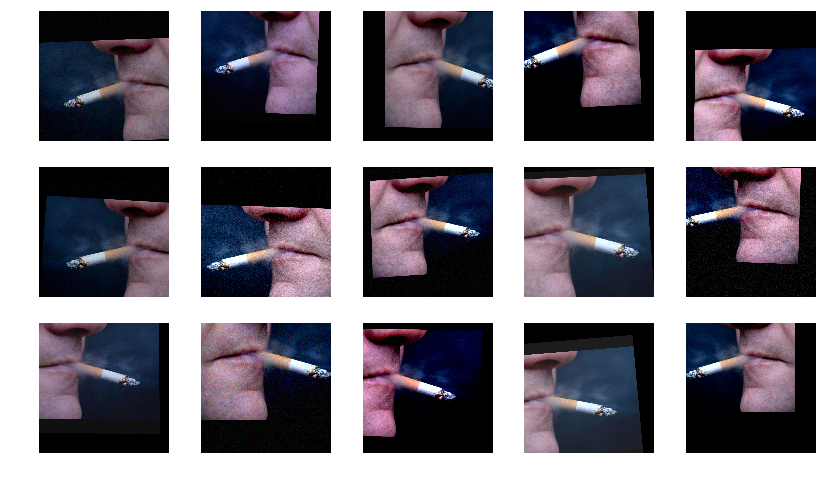

In [25]:
# Some example augmentations using the seq defined above.
display_images( [image], titles=['original'])

image_list = []
for i in range(15):
    image_aug = seq_of_aug.augment_image(image)
    image_list.append( image_aug)
    
display_images( image_list, cols=5)

mask                     shape: (56, 56, 1)           min:    0.00000  max:    1.00000  bool


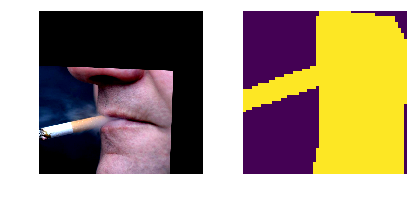

In [26]:
# Add augmentation and mask resizing.
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
    dataset, config, image_id, augmentation=seq_of_aug, use_mini_mask=True)
log("mask", mask)
display_images([image]+[mask[:,:,i] for i in range(min(mask.shape[-1], 7))])

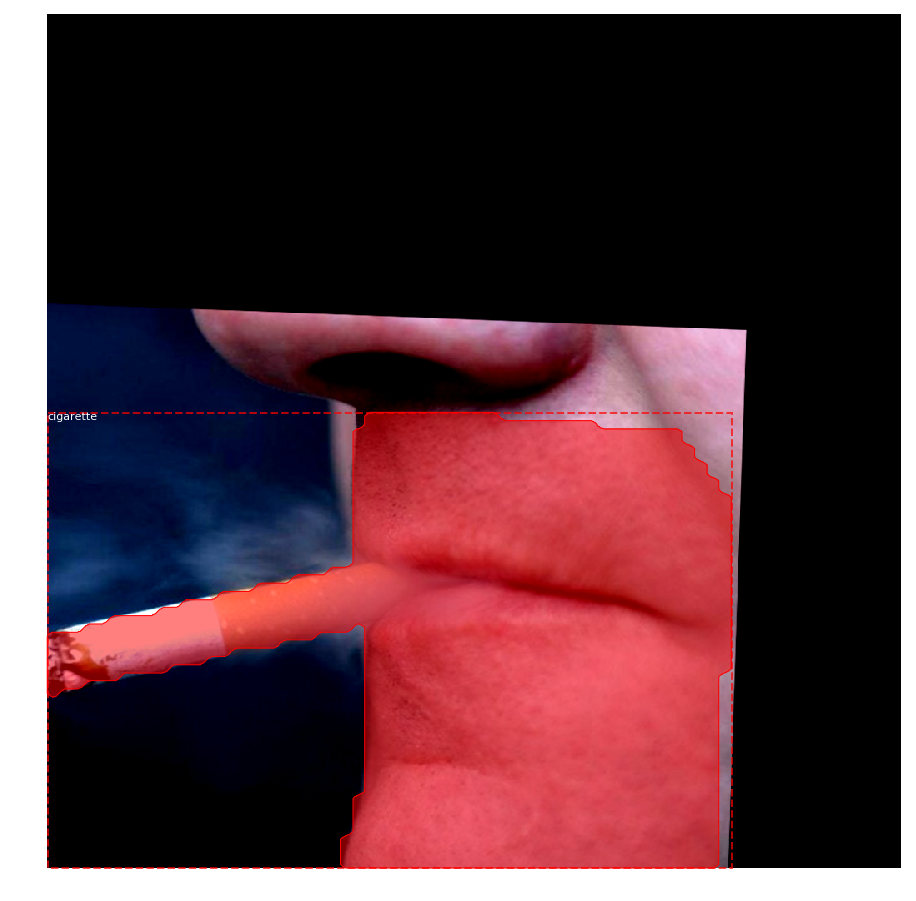

In [27]:

mask = utils.expand_mask(bbox, mask, image.shape)
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

In [28]:
# Generate Anchors
backbone_shapes = modellib.compute_backbone_shapes(config, config.IMAGE_SHAPE)
anchors = utils.generate_pyramid_anchors(config.RPN_ANCHOR_SCALES, 
                                          config.RPN_ANCHOR_RATIOS,
                                          backbone_shapes,
                                          config.BACKBONE_STRIDES, 
                                          config.RPN_ANCHOR_STRIDE)

# Print summary of anchors
num_levels = len(backbone_shapes)
anchors_per_cell = len(config.RPN_ANCHOR_RATIOS)
print("Count: ", anchors.shape[0])
print("Scales: ", config.RPN_ANCHOR_SCALES)
print("ratios: ", config.RPN_ANCHOR_RATIOS)
print("Anchors per Cell: ", anchors_per_cell)
print("Levels: ", num_levels)
anchors_per_level = []
for l in range(num_levels):
    num_cells = backbone_shapes[l][0] * backbone_shapes[l][1]
    anchors_per_level.append(anchors_per_cell * num_cells // config.RPN_ANCHOR_STRIDE**2)
    print("Anchors in Level {}: {}".format(l, anchors_per_level[l]))

Count:  261888
Scales:  (32, 64, 128, 256, 512)
ratios:  [0.5, 1, 2]
Anchors per Cell:  3
Levels:  5
Anchors in Level 0: 196608
Anchors in Level 1: 49152
Anchors in Level 2: 12288
Anchors in Level 3: 3072
Anchors in Level 4: 768


Level 0. Anchors: 196608  Feature map Shape: [256 256]
Level 1. Anchors:  49152  Feature map Shape: [128 128]
Level 2. Anchors:  12288  Feature map Shape: [64 64]
Level 3. Anchors:   3072  Feature map Shape: [32 32]
Level 4. Anchors:    768  Feature map Shape: [16 16]


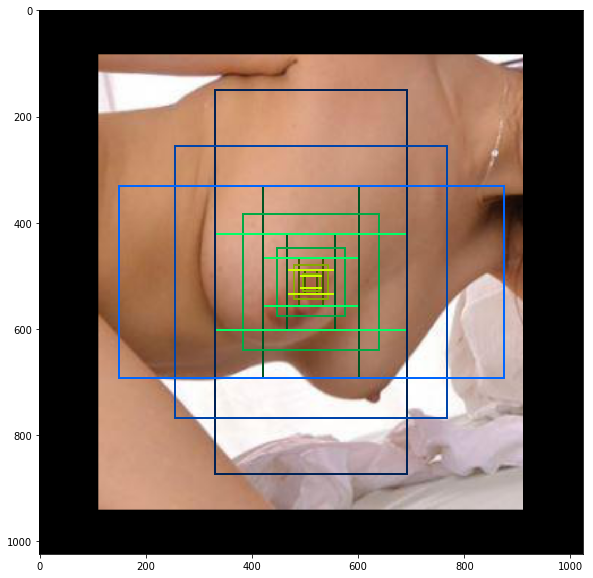

In [29]:
## Visualize anchors of one cell at the center of the feature map of a specific level



# Load and draw random image
image_id = np.random.choice(dataset.image_ids, 1)[0]
image, image_meta, _, _, _ = modellib.load_image_gt(dataset, config, image_id)
fig, ax = plt.subplots(1, figsize=(10, 10))
ax.imshow(image)
levels = len(backbone_shapes)

for level in range(levels):
    colors = visualize.random_colors(levels)
    # Compute the index of the anchors at the center of the image
    level_start = sum(anchors_per_level[:level]) # sum of anchors of previous levels
    level_anchors = anchors[level_start:level_start+anchors_per_level[level]]
    print("Level {}. Anchors: {:6}  Feature map Shape: {}".format(level, level_anchors.shape[0], 
                                                                  backbone_shapes[level]))
    center_cell = backbone_shapes[level] // 2
    center_cell_index = (center_cell[0] * backbone_shapes[level][1] + center_cell[1])
    level_center = center_cell_index * anchors_per_cell 
    center_anchor = anchors_per_cell * (
        (center_cell[0] * backbone_shapes[level][1] / config.RPN_ANCHOR_STRIDE**2) \
        + center_cell[1] / config.RPN_ANCHOR_STRIDE)
    level_center = int(center_anchor)

    # Draw anchors. Brightness show the order in the array, dark to bright.
    for i, rect in enumerate(level_anchors[level_center:level_center+anchors_per_cell]):
        y1, x1, y2, x2 = rect
        p = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=2, facecolor='none',
                              edgecolor=(i+1)*np.array(colors[level]) / anchors_per_cell)
        ax.add_patch(p)

In [0]:
# Create data generator
random_rois = 2000
g = modellib.data_generator(
    dataset, config, shuffle=True, random_rois=random_rois, 
    batch_size=4,
    detection_targets=True,
    augmentation=seq_of_aug
    )

In [31]:
if debugging:
    # Run the generator through a lot of images
    for i in range(10):
        print(i)
        _, _ = next(g)

0
1
2
3
4
5
6
7
8
9


In [32]:
# Get Next Image
if random_rois:
    [normalized_images, image_meta, rpn_match, rpn_bbox, gt_class_ids, gt_boxes, gt_masks, rpn_rois, rois], \
    [mrcnn_class_ids, mrcnn_bbox, mrcnn_mask] = next(g)
    
    log("rois", rois)
    log("mrcnn_class_ids", mrcnn_class_ids)
    log("mrcnn_bbox", mrcnn_bbox)
    log("mrcnn_mask", mrcnn_mask)
else:
    [normalized_images, image_meta, rpn_match, rpn_bbox, gt_boxes, gt_masks], _ = next(g)
    
log("gt_class_ids", gt_class_ids)
log("gt_boxes", gt_boxes)
log("gt_masks", gt_masks)
log("rpn_match", rpn_match, )
log("rpn_bbox", rpn_bbox)
image_id = modellib.parse_image_meta(image_meta)["image_id"][0]
print("image_id: ", image_id, dataset.image_reference(image_id))

# Remove the last dim in mrcnn_class_ids. It's only added
# to satisfy Keras restriction on target shape.
mrcnn_class_ids = mrcnn_class_ids[:,:,0]

rois                     shape: (4, 200, 4)           min:    1.00000  max: 1023.00000  int32
mrcnn_class_ids          shape: (4, 200, 1)           min:    0.00000  max:    3.00000  int32
mrcnn_bbox               shape: (4, 200, 6, 4)        min:   -2.92697  max:    3.53093  float32
mrcnn_mask               shape: (4, 200, 28, 28, 6)   min:    0.00000  max:    1.00000  float32
gt_class_ids             shape: (4, 100)              min:    0.00000  max:    3.00000  int32
gt_boxes                 shape: (4, 100, 4)           min:    0.00000  max: 1024.00000  int32
gt_masks                 shape: (4, 56, 56, 100)      min:    0.00000  max:    1.00000  bool
rpn_match                shape: (4, 261888, 1)        min:   -1.00000  max:    1.00000  int32
rpn_bbox                 shape: (4, 256, 4)           min:   -2.01172  max:    1.73828  float64
image_id:  2400 /content/gdrive/My Drive/Colab Notebooks/BCI/99 project/Mask_RCNN/images/all_data/alcohol720.jpg


anchors                  shape: (261888, 4)           min: -362.03867  max: 1322.03867  float64
refined_anchors          shape: (4, 4)                min:  430.00000  max: 1024.00000  float32
Positive anchors: 4
Negative anchors: 252
Neutral anchors: 261632
BG                     : 180
alcohol                : 20


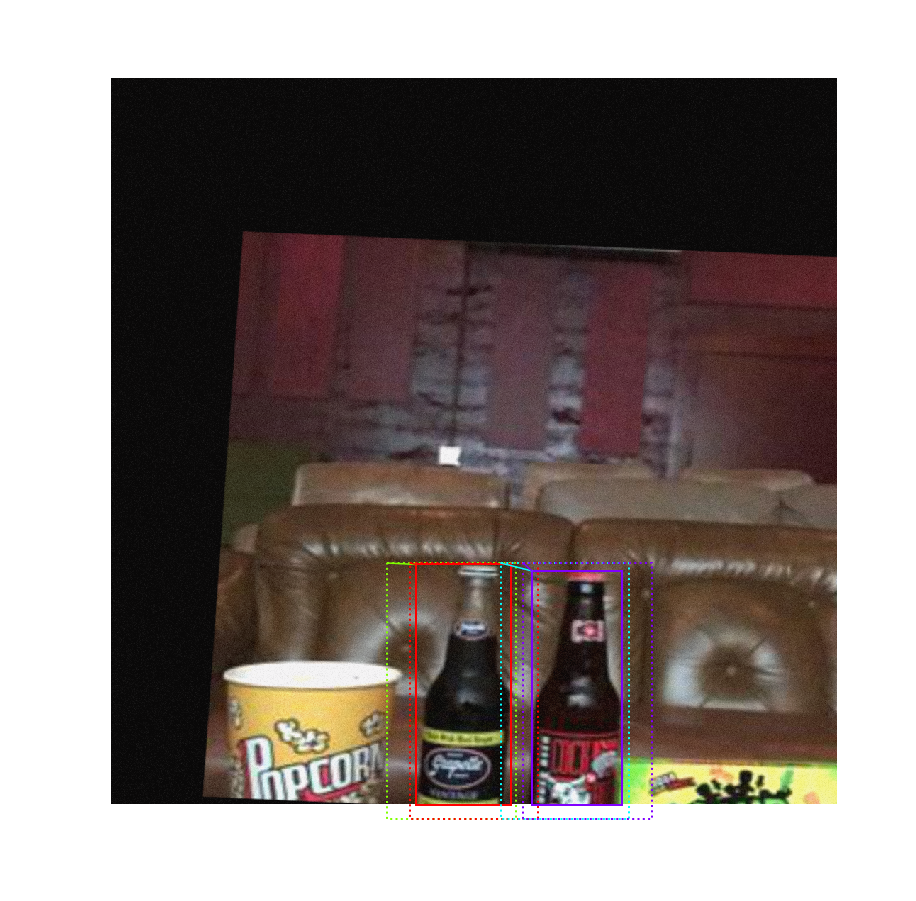

In [33]:
b = 0

# Restore original image (reverse normalization)
sample_image = modellib.unmold_image(normalized_images[b], config)

# Compute anchor shifts.
indices = np.where(rpn_match[b] == 1)[0]
refined_anchors = utils.apply_box_deltas(anchors[indices], rpn_bbox[b, :len(indices)] * config.RPN_BBOX_STD_DEV)
log("anchors", anchors)
log("refined_anchors", refined_anchors)

# Get list of positive anchors
positive_anchor_ids = np.where(rpn_match[b] == 1)[0]
print("Positive anchors: {}".format(len(positive_anchor_ids)))
negative_anchor_ids = np.where(rpn_match[b] == -1)[0]
print("Negative anchors: {}".format(len(negative_anchor_ids)))
neutral_anchor_ids = np.where(rpn_match[b] == 0)[0]
print("Neutral anchors: {}".format(len(neutral_anchor_ids)))

# ROI breakdown by class
for c, n in zip(dataset.class_names, np.bincount(mrcnn_class_ids[b].flatten())):
    if n:
        print("{:23}: {}".format(c[:20], n))

# Show positive anchors
fig, ax = plt.subplots(1, figsize=(16, 16))
visualize.draw_boxes(sample_image, boxes=anchors[positive_anchor_ids], 
                     refined_boxes=refined_anchors, ax=ax)

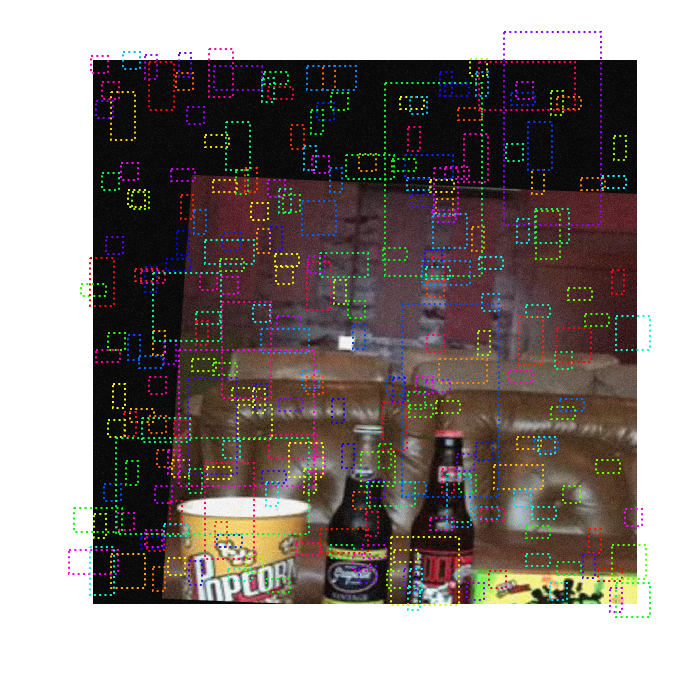

In [34]:
# Show negative anchors
visualize.draw_boxes(sample_image, boxes=anchors[negative_anchor_ids])



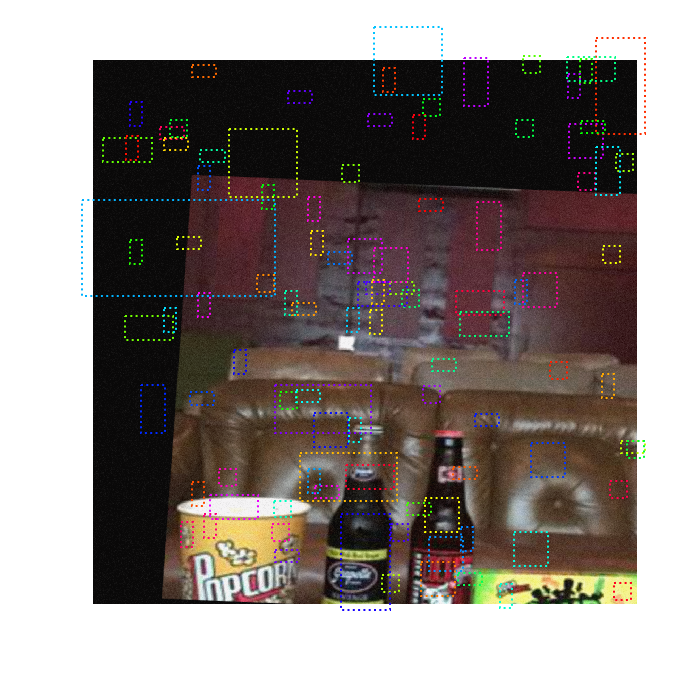

In [35]:
# Show neutral anchors. They don't contribute to training.
visualize.draw_boxes(sample_image, boxes=anchors[np.random.choice(neutral_anchor_ids, 100)])

Positive ROIs:  20
Negative ROIs:  180
Positive Ratio: 0.10
Unique ROIs: 200 out of 200


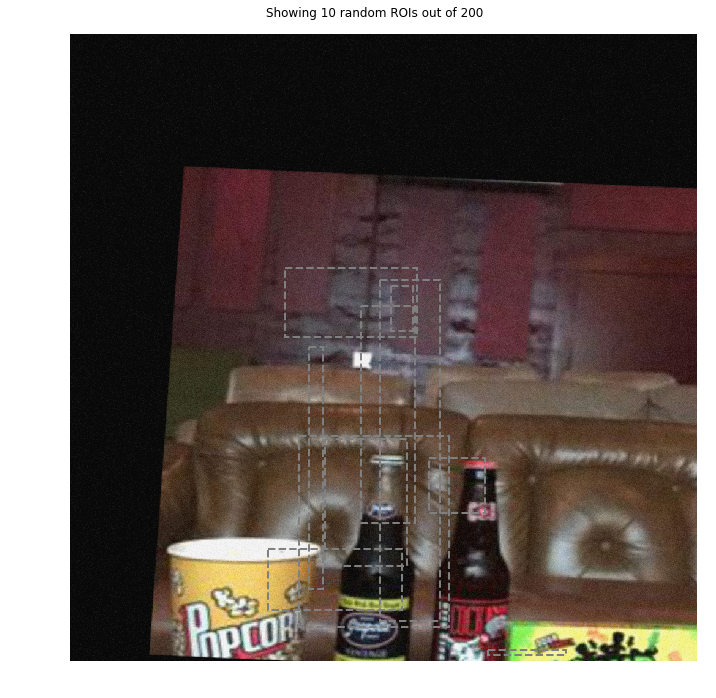

In [36]:
if random_rois:
    # Class aware bboxes
    bbox_specific = mrcnn_bbox[b, np.arange(mrcnn_bbox.shape[1]), mrcnn_class_ids[b], :]

    # Refined ROIs
    refined_rois = utils.apply_box_deltas(rois[b].astype(np.float32), bbox_specific[:,:4] * config.BBOX_STD_DEV)

    # Class aware masks
    mask_specific = mrcnn_mask[b, np.arange(mrcnn_mask.shape[1]), :, :, mrcnn_class_ids[b]]

    visualize.draw_rois(sample_image, rois[b], refined_rois, mask_specific, mrcnn_class_ids[b], dataset.class_names)
    
    # Any repeated ROIs?
    rows = np.ascontiguousarray(rois[b]).view(np.dtype((np.void, rois.dtype.itemsize * rois.shape[-1])))
    _, idx = np.unique(rows, return_index=True)
    print("Unique ROIs: {} out of {}".format(len(idx), rois.shape[1]))

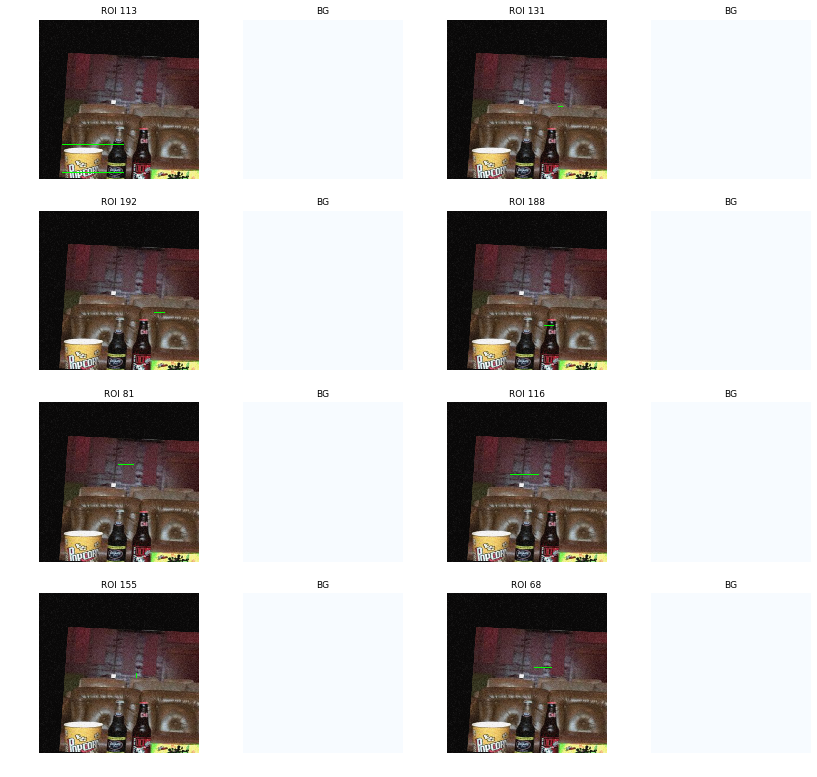

In [37]:
if random_rois:
    # Dispalay ROIs and corresponding masks and bounding boxes
    ids = random.sample(range(rois.shape[1]), 8)

    images = []
    titles = []
    for i in ids:
        image = visualize.draw_box(sample_image.copy(), rois[b,i,:4].astype(np.int32), [255, 0, 0])
        image = visualize.draw_box(image, refined_rois[i].astype(np.int64), [0, 255, 0])
        images.append(image)
        titles.append("ROI {}".format(i))
        images.append(mask_specific[i] * 255)
        titles.append(dataset.class_names[mrcnn_class_ids[b,i]][:20])

    display_images(images, titles, cols=4, cmap="Blues", interpolation="none")

In [38]:
# Check ratio of positive ROIs in a set of images.
if random_rois:
    limit = 10
    temp_g = modellib.data_generator(
        dataset, config, shuffle=True, random_rois=10000, 
        batch_size=1, detection_targets=True)
    total = 0
    for i in range(limit):
        _, [ids, _, _] = next(temp_g)
        positive_rois = np.sum(ids[0] > 0)
        total += positive_rois
        print("{:5} {:5.2f}".format(positive_rois, positive_rois/ids.shape[1]))
    print("Average percent: {:.2f}".format(total/(limit*ids.shape[1])))

   66  0.33
   66  0.33
   66  0.33
   66  0.33
   66  0.33
   66  0.33
   66  0.33
   66  0.33
Average percent: 0.33


#TRAIN

In [39]:
print("dataset dir:", dataset_path)
print("modesl dir:", models_dir)

dataset dir: /content/gdrive/My Drive/Colab Notebooks/BCI/99 project/Mask_RCNN/images/
modesl dir: /content/gdrive/My Drive/Colab Notebooks/BCI/99 project/Mask_RCNN/models/


In [40]:
# Setup configuration
config = det.DetConfig('alcohol', ['alcohol', 'boob', 'cigarette', 'knife' ,'gun'])
config.display()


Configurations:
ACTIVATION                     relu
ALL_CLASS_NAMES                ['BG', 'alcohol', 'boob', 'cigarette', 'knife', 'gun']
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     2
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
CLASS_NAMES                    ['alcohol', 'boob', 'cigarette', 'knife', 'gun']
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.5
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 2
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                18
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
L

In [41]:
config.ACTIVATION = 'leakyrelu'
config.DETECTION_MIN_CONFIDENCE = 0.9
print(config.ACTIVATION)
print(config.DETECTION_MIN_CONFIDENCE)

leakyrelu
0.9


In [42]:
# Create the model
model = modellib.MaskRCNN(mode='training', 
                          config=config,
                          model_dir=models_dir)

model.keras_model.summary()

W0814 06:03:03.345665 140553877170048 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0814 06:03:03.396067 140553877170048 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W0814 06:03:03.432774 140553877170048 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:1919: The name tf.nn.fused_batch_norm is deprecated. Please use tf.compat.v1.nn.fused_batch_norm instead.

W0814 06:03:03.438262 140553877170048 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:3976: The name tf.nn.max_pool is deprecated. Please use tf.nn.max_pool2d instead.

W0814 06:03:06.223816 140553877170048 deprecation

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_image (InputLayer)        (None, None, None, 3 0                                            
__________________________________________________________________________________________________
zero_padding2d_1 (ZeroPadding2D (None, None, None, 3 0           input_image[0][0]                
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, None, None, 6 9472        zero_padding2d_1[0][0]           
__________________________________________________________________________________________________
bn_conv1 (BatchNorm)            (None, None, None, 6 256         conv1[0][0]                      
__________________________________________________________________________________________________
activation

In [43]:
# Load the weights

# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(models_dir, "alcohol20190814T0345/mask_rcnn_alcohol_0039.h5")
# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)
else:
    print("using existing ", COCO_MODEL_PATH)
    
# For the coco dataset exclude the last layers because 
# it requires a matching number of classes
print("loading...", end='')
model.load_weights(COCO_MODEL_PATH, by_name=True, exclude=[
    "mrcnn_class_logits", "mrcnn_bbox_fc",
    "mrcnn_bbox", "mrcnn_mask"])

print("loaded.")

using existing  /content/gdrive/My Drive/Colab Notebooks/BCI/99 project/Mask_RCNN/models/alcohol20190814T0345/mask_rcnn_alcohol_0039.h5
loading...Re-starting from epoch 39
loaded.


In [0]:
from keras.callbacks import EarlyStopping
es = EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=1, mode='min')


def train(model, dataset_path, epochs=10):
    """Train the model."""
    use_multiprocessing=True
    
    # Create the train and val dataset.
    dataset_train, dataset_val = det.create_datasets(dataset_path+'all_data', config)

    # Prepare them
    dataset_train.prepare()
    dataset_val.prepare()

    # Experiment with training options.
    # Since we're using a very small dataset, and starting from
    # COCO trained weights, we don't need to train too long. Also,
    # no need to train all layers, just the heads should do it.
    print("Training network heads")
    history = model.train(dataset_train, dataset_val,
                learning_rate=config.LEARNING_RATE,
                epochs=epochs,
                layers='all',
                augmentation=seq_of_aug, custom_callbacks=[TensorBoardColabCallback(tbc)]
                )
    
    return history

In [45]:
%%time
history = train(model, dataset_path, 100)

Counter({'alcohol': 1469, 'gun': 1048, 'knife': 852, 'cigarette': 772, 'boob': 665})
Counter({'alcohol': 360, 'gun': 262, 'knife': 208, 'cigarette': 191, 'boob': 166})
Adding class   1:alcohol
Adding class   2:boob
Adding class   3:cigarette
Adding class   4:knife
Adding class   5:gun


/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 19660800 bytes but only got 0. Skipping tag 0
  " Skipping tag %s" % (size, len(data), tag))
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 9175040 bytes but only got 0. Skipping tag 2
  " Skipping tag %s" % (size, len(data), tag))
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 2883584 bytes but only got 0. Skipping tag 2
  " Skipping tag %s" % (size, len(data), tag))
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 65536 bytes but only got 0. Skipping tag 3
  " Skipping tag %s" % (size, len(data), tag))
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to rea

Adding class   1:alcohol
Adding class   2:boob
Adding class   3:cigarette
Adding class   4:knife
Adding class   5:gun


/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 4718592 bytes but only got 0. Skipping tag 0
  " Skipping tag %s" % (size, len(data), tag))


Training network heads

Starting at epoch 39. LR=0.001

Checkpoint Path: /content/gdrive/My Drive/Colab Notebooks/BCI/99 project/Mask_RCNN/models/alcohol20190814T0345/mask_rcnn_alcohol_{epoch:04d}.h5
Selecting layers to train
conv1                  (Conv2D)
bn_conv1               (BatchNorm)
res2a_branch2a         (Conv2D)
bn2a_branch2a          (BatchNorm)
res2a_branch2b         (Conv2D)
bn2a_branch2b          (BatchNorm)
res2a_branch2c         (Conv2D)
res2a_branch1          (Conv2D)
bn2a_branch2c          (BatchNorm)
bn2a_branch1           (BatchNorm)
res2b_branch2a         (Conv2D)
bn2b_branch2a          (BatchNorm)
res2b_branch2b         (Conv2D)
bn2b_branch2b          (BatchNorm)
res2b_branch2c         (Conv2D)
bn2b_branch2c          (BatchNorm)
res2c_branch2a         (Conv2D)
bn2c_branch2a          (BatchNorm)
res2c_branch2b         (Conv2D)
bn2c_branch2b          (BatchNorm)
res2c_branch2c         (Conv2D)
bn2c_branch2c          (BatchNorm)
res3a_branch2a         (Conv2D)
bn3a_

W0814 06:04:43.944733 140553877170048 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/optimizers.py:790: The name tf.train.Optimizer is deprecated. Please use tf.compat.v1.train.Optimizer instead.

/usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/gradients_util.py:93: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/gradients_util.py:93: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/gradients_util.py:93: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Co

Epoch 40/100
100/100 [==============================] - 302s 3s/step - loss: 1.7456 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.6147 - mrcnn_class_loss: 0.1603 - mrcnn_bbox_loss: 0.4954 - mrcnn_mask_loss: 0.4673 - val_loss: 1.3672 - val_rpn_class_loss: 0.0122 - val_rpn_bbox_loss: 0.5563 - val_mrcnn_class_loss: 0.1091 - val_mrcnn_bbox_loss: 0.3719 - val_mrcnn_mask_loss: 0.3178

Epoch 00040: saving model to /content/gdrive/My Drive/Colab Notebooks/BCI/99 project/Mask_RCNN/models/alcohol20190814T0345/mask_rcnn_alcohol_0040.h5
Epoch 41/100
100/100 [==============================] - 185s 2s/step - loss: 1.1524 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.3741 - mrcnn_class_loss: 0.1249 - mrcnn_bbox_loss: 0.3430 - mrcnn_mask_loss: 0.3025 - val_loss: 1.0915 - val_rpn_class_loss: 0.0066 - val_rpn_bbox_loss: 0.3725 - val_mrcnn_class_loss: 0.1163 - val_mrcnn_bbox_loss: 0.3336 - val_mrcnn_mask_loss: 0.2626

Epoch 00041: saving model to /content/gdrive/My Drive/Colab Notebooks/BCI/99 project/Mask_R

/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 4718592 bytes but only got 0. Skipping tag 0
  " Skipping tag %s" % (size, len(data), tag))
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 4718592 bytes but only got 0. Skipping tag 0
  " Skipping tag %s" % (size, len(data), tag))


100/100 [==============================] - 182s 2s/step - loss: 0.7369 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2256 - mrcnn_class_loss: 0.0690 - mrcnn_bbox_loss: 0.1975 - mrcnn_mask_loss: 0.2400 - val_loss: 0.9566 - val_rpn_class_loss: 0.0069 - val_rpn_bbox_loss: 0.3928 - val_mrcnn_class_loss: 0.0565 - val_mrcnn_bbox_loss: 0.2181 - val_mrcnn_mask_loss: 0.2824

Epoch 00053: saving model to /content/gdrive/My Drive/Colab Notebooks/BCI/99 project/Mask_RCNN/models/alcohol20190814T0345/mask_rcnn_alcohol_0053.h5
Epoch 54/100
100/100 [==============================] - 182s 2s/step - loss: 0.8909 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.3115 - mrcnn_class_loss: 0.0740 - mrcnn_bbox_loss: 0.2183 - mrcnn_mask_loss: 0.2791 - val_loss: 0.8657 - val_rpn_class_loss: 0.0059 - val_rpn_bbox_loss: 0.3338 - val_mrcnn_class_loss: 0.0874 - val_mrcnn_bbox_loss: 0.1814 - val_mrcnn_mask_loss: 0.2572

Epoch 00054: saving model to /content/gdrive/My Drive/Colab Notebooks/BCI/99 project/Mask_RCNN/models/al

/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 4718592 bytes but only got 0. Skipping tag 0
  " Skipping tag %s" % (size, len(data), tag))
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 4718592 bytes but only got 0. Skipping tag 0
  " Skipping tag %s" % (size, len(data), tag))


100/100 [==============================] - 185s 2s/step - loss: 0.7899 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.2614 - mrcnn_class_loss: 0.0601 - mrcnn_bbox_loss: 0.2031 - mrcnn_mask_loss: 0.2564 - val_loss: 0.9806 - val_rpn_class_loss: 0.0085 - val_rpn_bbox_loss: 0.3591 - val_mrcnn_class_loss: 0.0668 - val_mrcnn_bbox_loss: 0.2792 - val_mrcnn_mask_loss: 0.2671

Epoch 00058: saving model to /content/gdrive/My Drive/Colab Notebooks/BCI/99 project/Mask_RCNN/models/alcohol20190814T0345/mask_rcnn_alcohol_0058.h5
Epoch 59/100
100/100 [==============================] - 184s 2s/step - loss: 0.8192 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.2916 - mrcnn_class_loss: 0.0557 - mrcnn_bbox_loss: 0.2008 - mrcnn_mask_loss: 0.2634 - val_loss: 0.9872 - val_rpn_class_loss: 0.0068 - val_rpn_bbox_loss: 0.3099 - val_mrcnn_class_loss: 0.0763 - val_mrcnn_bbox_loss: 0.2856 - val_mrcnn_mask_loss: 0.3086

Epoch 00059: saving model to /content/gdrive/My Drive/Colab Notebooks/BCI/99 project/Mask_RCNN/models/al

/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 19660800 bytes but only got 0. Skipping tag 0
  " Skipping tag %s" % (size, len(data), tag))
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 9175040 bytes but only got 0. Skipping tag 2
  " Skipping tag %s" % (size, len(data), tag))
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 2883584 bytes but only got 0. Skipping tag 2
  " Skipping tag %s" % (size, len(data), tag))
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 65536 bytes but only got 0. Skipping tag 3
  " Skipping tag %s" % (size, len(data), tag))
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to rea

 35/100 [=========>....................] - ETA: 1:41 - loss: 0.8119 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.3110 - mrcnn_class_loss: 0.0386 - mrcnn_bbox_loss: 0.1978 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 19660800 bytes but only got 0. Skipping tag 0
  " Skipping tag %s" % (size, len(data), tag))
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 9175040 bytes but only got 0. Skipping tag 2
  " Skipping tag %s" % (size, len(data), tag))
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 2883584 bytes but only got 0. Skipping tag 2
  " Skipping tag %s" % (size, len(data), tag))
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 65536 bytes but only got 0. Skipping tag 3
  " Skipping tag %s" % (size, len(data), tag))
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to rea

100/100 [==============================] - 183s 2s/step - loss: 0.7459 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.2307 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.2081 - mrcnn_mask_loss: 0.2572 - val_loss: 0.8354 - val_rpn_class_loss: 0.0063 - val_rpn_bbox_loss: 0.2864 - val_mrcnn_class_loss: 0.0582 - val_mrcnn_bbox_loss: 0.2150 - val_mrcnn_mask_loss: 0.2695

Epoch 00064: saving model to /content/gdrive/My Drive/Colab Notebooks/BCI/99 project/Mask_RCNN/models/alcohol20190814T0345/mask_rcnn_alcohol_0064.h5
Epoch 65/100
100/100 [==============================] - 183s 2s/step - loss: 0.8726 - rpn_class_loss: 0.0127 - rpn_bbox_loss: 0.3488 - mrcnn_class_loss: 0.0642 - mrcnn_bbox_loss: 0.1856 - mrcnn_mask_loss: 0.2613 - val_loss: 0.9982 - val_rpn_class_loss: 0.0082 - val_rpn_bbox_loss: 0.3774 - val_mrcnn_class_loss: 0.0715 - val_mrcnn_bbox_loss: 0.2496 - val_mrcnn_mask_loss: 0.2916

Epoch 00065: saving model to /content/gdrive/My Drive/Colab Notebooks/BCI/99 project/Mask_RCNN/models/al

/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 19660800 bytes but only got 0. Skipping tag 0
  " Skipping tag %s" % (size, len(data), tag))
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 9175040 bytes but only got 0. Skipping tag 2
  " Skipping tag %s" % (size, len(data), tag))
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 2883584 bytes but only got 0. Skipping tag 2
  " Skipping tag %s" % (size, len(data), tag))
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 65536 bytes but only got 0. Skipping tag 3
  " Skipping tag %s" % (size, len(data), tag))
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to rea

 43/100 [===========>..................] - ETA: 1:29 - loss: 0.6029 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1955 - mrcnn_class_loss: 0.0430 - mrcnn_bbox_loss: 0.1362 - mrcnn_mask_loss: 0.2243

/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 19660800 bytes but only got 0. Skipping tag 0
  " Skipping tag %s" % (size, len(data), tag))
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 9175040 bytes but only got 0. Skipping tag 2
  " Skipping tag %s" % (size, len(data), tag))
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 2883584 bytes but only got 0. Skipping tag 2
  " Skipping tag %s" % (size, len(data), tag))
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 65536 bytes but only got 0. Skipping tag 3
  " Skipping tag %s" % (size, len(data), tag))
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to rea

100/100 [==============================] - 183s 2s/step - loss: 0.6296 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1800 - mrcnn_class_loss: 0.0512 - mrcnn_bbox_loss: 0.1561 - mrcnn_mask_loss: 0.2387 - val_loss: 0.9499 - val_rpn_class_loss: 0.0089 - val_rpn_bbox_loss: 0.3957 - val_mrcnn_class_loss: 0.0617 - val_mrcnn_bbox_loss: 0.2143 - val_mrcnn_mask_loss: 0.2693

Epoch 00083: saving model to /content/gdrive/My Drive/Colab Notebooks/BCI/99 project/Mask_RCNN/models/alcohol20190814T0345/mask_rcnn_alcohol_0083.h5
Epoch 84/100
100/100 [==============================] - 183s 2s/step - loss: 0.6304 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2029 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.1512 - mrcnn_mask_loss: 0.2175 - val_loss: 0.7111 - val_rpn_class_loss: 0.0029 - val_rpn_bbox_loss: 0.2147 - val_mrcnn_class_loss: 0.0447 - val_mrcnn_bbox_loss: 0.2060 - val_mrcnn_mask_loss: 0.2428

Epoch 00084: saving model to /content/gdrive/My Drive/Colab Notebooks/BCI/99 project/Mask_RCNN/models/al

/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 4718592 bytes but only got 0. Skipping tag 0
  " Skipping tag %s" % (size, len(data), tag))


100/100 [==============================] - 185s 2s/step - loss: 0.8226 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.3032 - mrcnn_class_loss: 0.0603 - mrcnn_bbox_loss: 0.1877 - mrcnn_mask_loss: 0.2637 - val_loss: 1.0795 - val_rpn_class_loss: 0.0078 - val_rpn_bbox_loss: 0.4320 - val_mrcnn_class_loss: 0.0850 - val_mrcnn_bbox_loss: 0.2601 - val_mrcnn_mask_loss: 0.2946

Epoch 00087: saving model to /content/gdrive/My Drive/Colab Notebooks/BCI/99 project/Mask_RCNN/models/alcohol20190814T0345/mask_rcnn_alcohol_0087.h5
Epoch 88/100
 99/100 [============================>.] - ETA: 1s - loss: 0.7516 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2240 - mrcnn_class_loss: 0.0656 - mrcnn_bbox_loss: 0.2000 - mrcnn_mask_loss: 0.2564

/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 4718592 bytes but only got 0. Skipping tag 0
  " Skipping tag %s" % (size, len(data), tag))


100/100 [==============================] - 183s 2s/step - loss: 0.7498 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2234 - mrcnn_class_loss: 0.0651 - mrcnn_bbox_loss: 0.1994 - mrcnn_mask_loss: 0.2562 - val_loss: 0.7129 - val_rpn_class_loss: 0.0070 - val_rpn_bbox_loss: 0.2449 - val_mrcnn_class_loss: 0.0556 - val_mrcnn_bbox_loss: 0.1882 - val_mrcnn_mask_loss: 0.2172

Epoch 00088: saving model to /content/gdrive/My Drive/Colab Notebooks/BCI/99 project/Mask_RCNN/models/alcohol20190814T0345/mask_rcnn_alcohol_0088.h5
Epoch 89/100
100/100 [==============================] - 184s 2s/step - loss: 0.7772 - rpn_class_loss: 0.0194 - rpn_bbox_loss: 0.3107 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.1567 - mrcnn_mask_loss: 0.2449 - val_loss: 0.8833 - val_rpn_class_loss: 0.0048 - val_rpn_bbox_loss: 0.2868 - val_mrcnn_class_loss: 0.0565 - val_mrcnn_bbox_loss: 0.2400 - val_mrcnn_mask_loss: 0.2952

Epoch 00089: saving model to /content/gdrive/My Drive/Colab Notebooks/BCI/99 project/Mask_RCNN/models/al

In [0]:
import math

def plot_history(history):
    
    fig = plt.figure(figsize=(16,10))
       
    n_history_loss = len(history.history)
    n_epochs = len(history.epoch)
    epoch = history.epoch
    
    # The loss is in pairs, one for train, one for val
    loss_stats = [ k for k in history.history.keys() if 'val_' not in k ]
    
    n_cols = 4
    n_rows = math.ceil(len(loss_stats) / n_cols) 
    
    for i, k in enumerate(loss_stats):
        val_k = 'val_'+k
        ax = plt.subplot( n_rows, n_cols, i+1)
        ax.plot(epoch, history.history[k], label=k)
        ax.plot(epoch, history.history[val_k], label=val_k)
        ax.set_xlabel('Epochs')
        ax.set_ylabel('Loss')
        ax.set_title(str(i)+' - '+k)
        plt.legend(shadow=True, fancybox=True)
    
    fig.tight_layout()
    plt.show()

In [0]:
# # Plot training stats for each of the networks.
# plot_history(history) 

In [48]:
class InferenceConfig(det.DetConfig):
    # Set batch size to 1 since we'll be running inference on
    # one image at a time. Batch size = GPU_COUNT * IMAGES_PER_GPU
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
#    NUM_CLASSES = 2 # For BG + Others

det.DetConfig.DETECTION_MIN_CONFIDENCE = 0.5
det.DetConfig.ACTIVATION = 'leakyrelu'
inf_config = InferenceConfig('boob', ['alcohol', 'boob', 'cigarette', 'knife' ,'gun'])
inf_model = modellib.MaskRCNN(mode="inference", 
                              config=inf_config,
                              model_dir=models_dir)

inf_config.display()

# Find last trained weights
#weights_path = inf_model.find_last()[1]

# When testing use the latest, for demo use stable model
weights_path = os.path.join(models_dir, "alcohol20190814T0345/mask_rcnn_alcohol_0100.h5")
# weights_path = os.path.join(models_dir, "wolf20180516T0136_mask_rcnn_wolf_0075.h5")


print("Using latest weights: ", weights_path)

inf_model.load_weights(weights_path, by_name=True)

W0814 09:17:52.235818 140553877170048 deprecation_wrapper.py:119] From /content/gdrive/My Drive/Colab Notebooks/BCI/99 project/Mask_RCNN/mrcnn/model.py:720: The name tf.sets.set_intersection is deprecated. Please use tf.sets.intersection instead.

W0814 09:17:52.345394 140553877170048 deprecation.py:323] From /content/gdrive/My Drive/Colab Notebooks/BCI/99 project/Mask_RCNN/mrcnn/model.py:772: to_float (from tensorflow.python.ops.math_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use `tf.cast` instead.



Configurations:
ACTIVATION                     leakyrelu
ALL_CLASS_NAMES                ['BG', 'alcohol', 'boob', 'cigarette', 'knife', 'gun']
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
CLASS_NAMES                    ['alcohol', 'boob', 'cigarette', 'knife', 'gun']
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.5
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                18
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.

In [0]:
import glob

def detect_instance(class_names, image_test_dir):
    """
    class_names: list of class names of the dataset
    image_filenames: list of images to analyze
    """

    det_filenames = sorted(glob.glob(image_test_dir+'/*'))

    for f in det_filenames:
        print("Processing image {}".format(f))

        test_img = plt.imread(f)
        print(test_img.shape)

        plt.imshow(test_img)
        # visualize.display_images([test_img])

        # Included in the results from detect are the found:
        # class_ids,their scores and masks.
        results = inf_model.detect([test_img], verbose=1)[0]

        print("Objects detected: ", len(results['class_ids']))

        # Visualize results
        visualize.display_instances(test_img, 
                                    results['rois'], 
                                    results['masks'], 
                                    results['class_ids'], 
                                    class_names, 
                                    results['scores'])

        print(results['class_ids'])

In [0]:
import math

def detect_instances(class_names, image_test_dir):
    """
    class_names: list of class names of the dataset
    image_filenames: list of images to analyze
    """
        
    det_filenames = sorted(glob.glob(image_test_dir+'/*'))

    fig = plt.figure(figsize=(16,10))

    n_cols = 3
    n_rows = math.ceil(len(det_filenames) / n_cols) 
    
    
    for i, f in enumerate(det_filenames):
        
        print("Processing image {}".format(f))
        
        ax = plt.subplot( n_rows, n_cols, i+1)

        test_img = plt.imread(f)

        # Included in the results from detect are the found:
        # class_ids,their scores and masks.
        results = inf_model.detect([test_img], verbose=1)[0]

        print("Objects detected: ", len(results['class_ids']))

        # Visualize results
        visualize.display_instances(test_img, 
                                    results['rois'], 
                                    results['masks'], 
                                    results['class_ids'], 
                                    class_names, 
                                    results['scores'],
                                    ax=ax)

        print(results['class_ids'])

Processing image /content/gdrive/My Drive/Colab Notebooks/BCI/99 project/Mask_RCNN/images/test/KakaoTalk_20190813_173545255_01.jpg
(854, 569, 3)
Processing 1 images
image                    shape: (854, 569, 3)         min:    5.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  142.10000  float64
image_metas              shape: (1, 18)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
Objects detected:  4


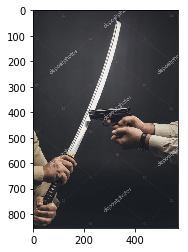

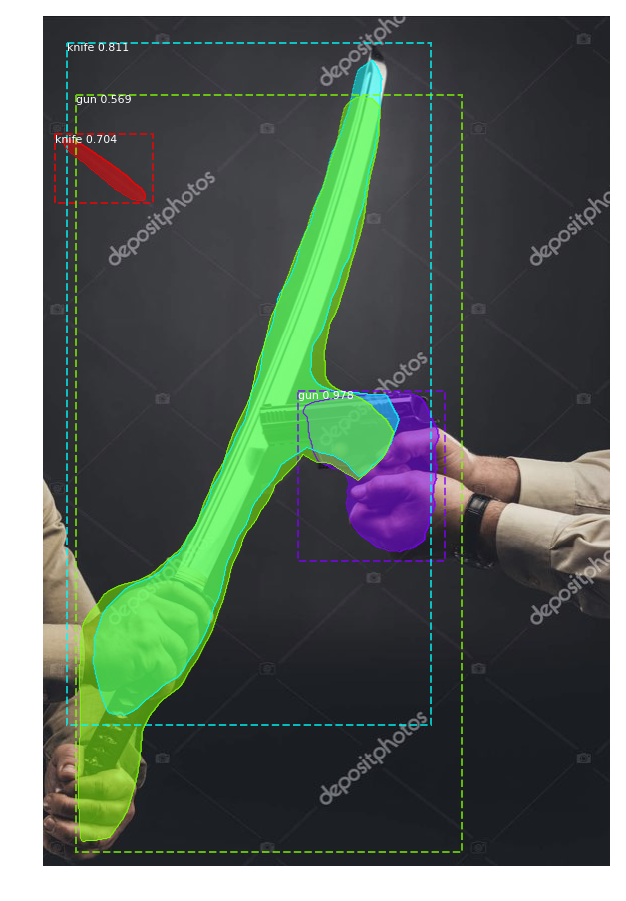

[5 4 4 5]
Processing image /content/gdrive/My Drive/Colab Notebooks/BCI/99 project/Mask_RCNN/images/test/KakaoTalk_20190813_173545255_02.jpg
(468, 750, 3)
Processing 1 images
image                    shape: (468, 750, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 18)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
Objects detected:  4


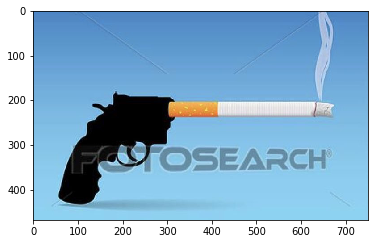

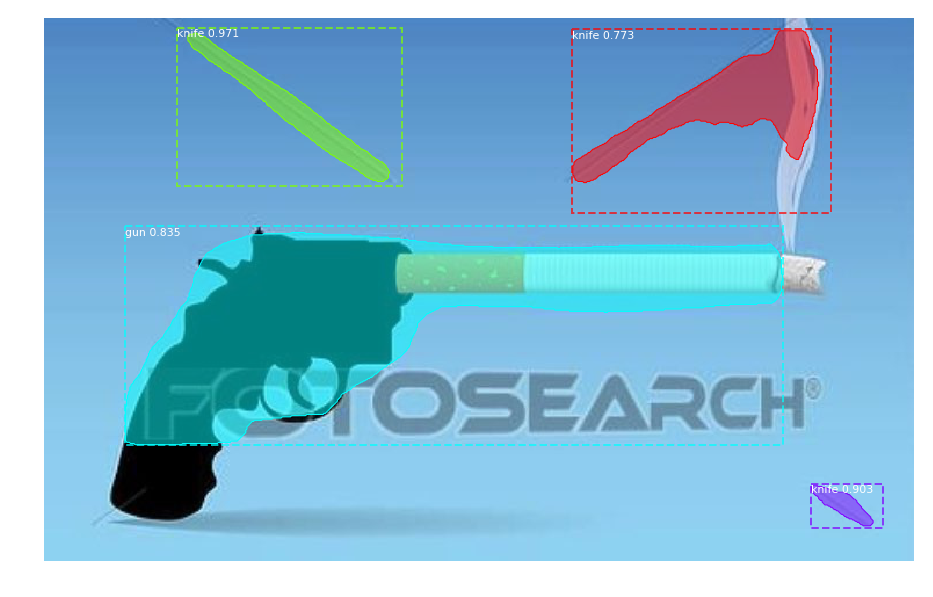

[4 4 5 4]
Processing image /content/gdrive/My Drive/Colab Notebooks/BCI/99 project/Mask_RCNN/images/test/maxresdefault.jpg
(720, 1280, 3)
Processing 1 images
image                    shape: (720, 1280, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  137.10000  float64
image_metas              shape: (1, 18)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
Objects detected:  2


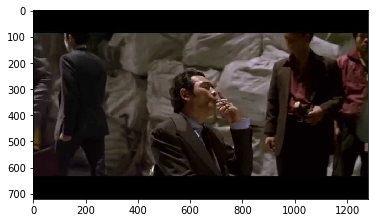

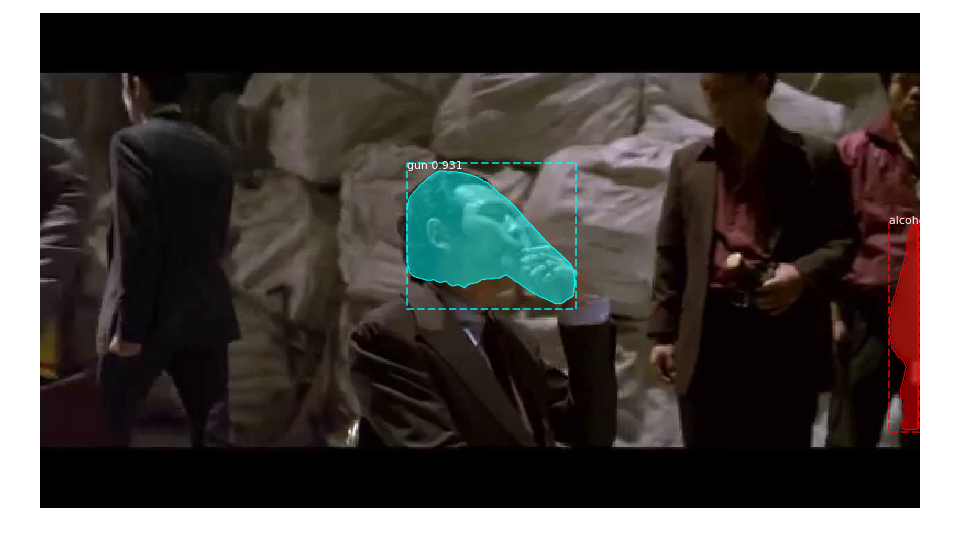

[1 5]
Processing image /content/gdrive/My Drive/Colab Notebooks/BCI/99 project/Mask_RCNN/images/test/스타쉽_트루퍼스_(2).jpg
(365, 596, 3)
Processing 1 images
image                    shape: (365, 596, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 18)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
Objects detected:  3


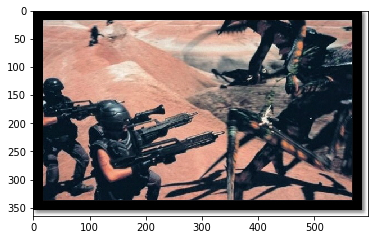

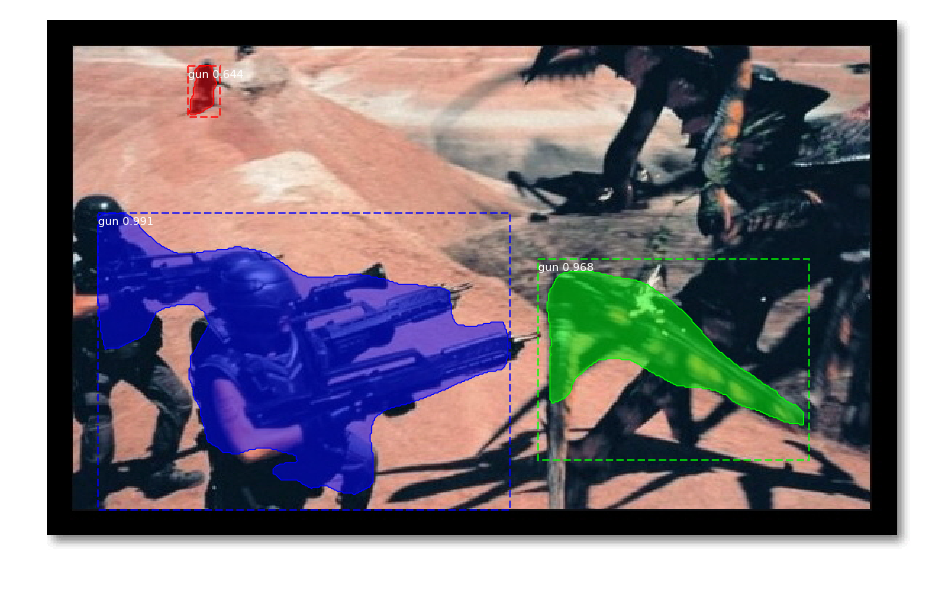

[5 5 5]
Processing image /content/gdrive/My Drive/Colab Notebooks/BCI/99 project/Mask_RCNN/images/test/스타쉽_트루퍼스_(4).jpg
(390, 684, 3)
Processing 1 images
image                    shape: (390, 684, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 18)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
Objects detected:  0

*** No instances to display *** 



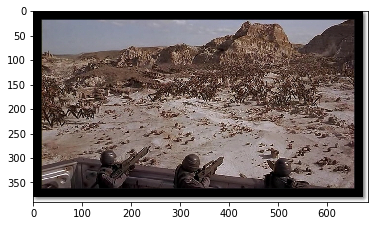

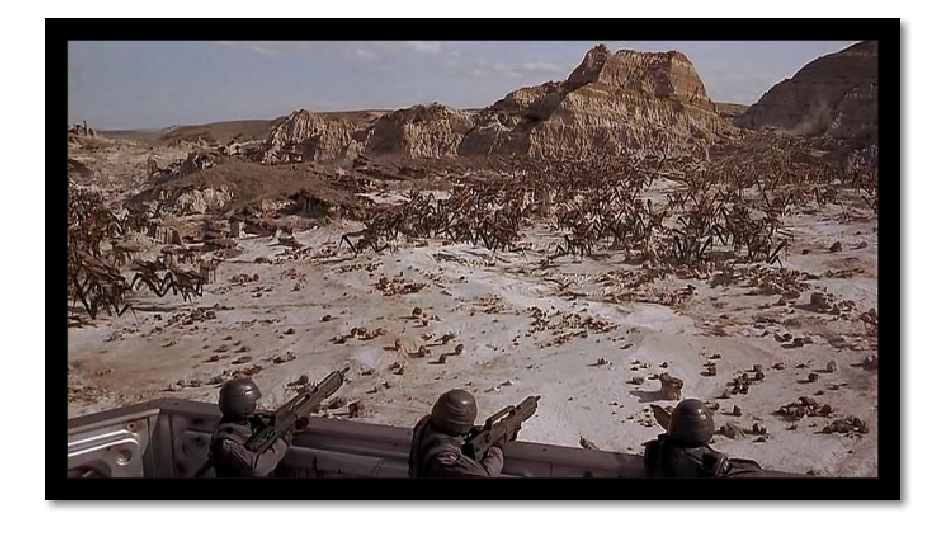

[]
Processing image /content/gdrive/My Drive/Colab Notebooks/BCI/99 project/Mask_RCNN/images/test/스타쉽_트루퍼스_(5).jpg
(392, 684, 3)
Processing 1 images
image                    shape: (392, 684, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 18)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
Objects detected:  1


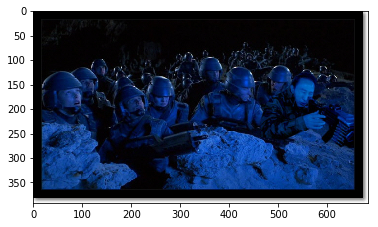

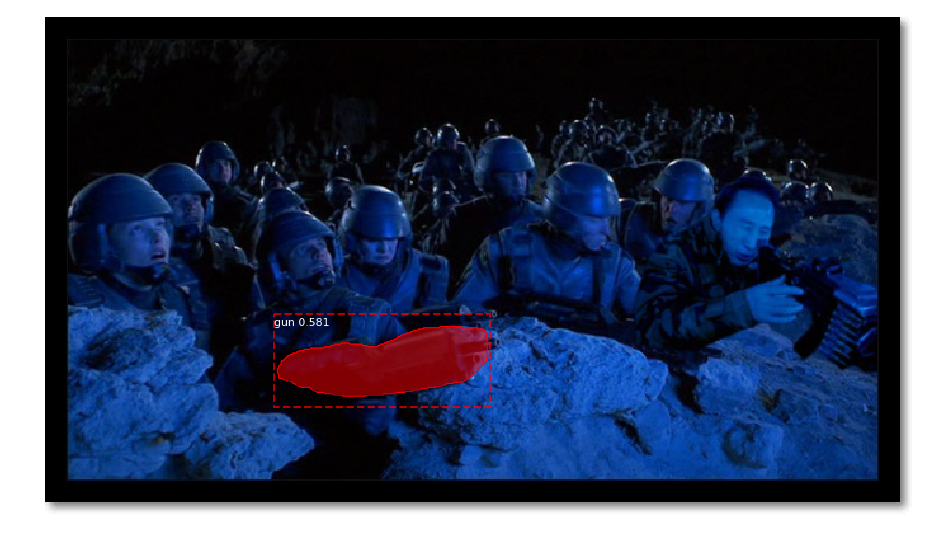

[5]


In [51]:
image_test_dir = os.path.join(ROOT_IMAGE_DIR, "test/")

if debugging:
    r = detect_instance(inf_config.ALL_CLASS_NAMES, image_test_dir)
else:
    r = detect_instances(inf_config.ALL_CLASS_NAMES, image_test_dir)

In [52]:
_, dataset_val = det.create_datasets(dataset_path + 'all_data/', inf_config)
dataset_val.prepare()

Counter({'alcohol': 1436, 'gun': 1050, 'knife': 845, 'cigarette': 779, 'boob': 665})
Counter({'alcohol': 393, 'gun': 260, 'knife': 215, 'cigarette': 184, 'boob': 166})
Adding class   1:alcohol
Adding class   2:boob
Adding class   3:cigarette
Adding class   4:knife
Adding class   5:gun


/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 4718592 bytes but only got 0. Skipping tag 0
  " Skipping tag %s" % (size, len(data), tag))
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 19660800 bytes but only got 0. Skipping tag 0
  " Skipping tag %s" % (size, len(data), tag))
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 9175040 bytes but only got 0. Skipping tag 2
  " Skipping tag %s" % (size, len(data), tag))
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to read 2883584 bytes but only got 0. Skipping tag 2
  " Skipping tag %s" % (size, len(data), tag))
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:725: UserWarning: Possibly corrupt EXIF data.  Expecting to r

Adding class   1:alcohol
Adding class   2:boob
Adding class   3:cigarette
Adding class   4:knife
Adding class   5:gun


In [0]:
# Compute VOC-Style mAP @ IoU=0.5

# Run on a subset.
#n_image_ids = max(20, len(dataset_val.image_ids))
#image_ids = np.random.choice(dataset_val.image_ids, n_image_ids)
image_ids = dataset_val.image_ids
APs = []

In [54]:
%%time
for image_id in image_ids:
    # Load image and ground truth data
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_val, inf_config,
                               image_id, use_mini_mask=False)
    molded_images = np.expand_dims(modellib.mold_image(image, inf_config), 0)
    # Run object detection
    results = inf_model.detect([image], verbose=0)
    r = results[0]
    # Compute AP
    AP, precisions, recalls, overlaps =\
        utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                         r["rois"], r["class_ids"], r["scores"], r['masks'])
    print(image_id, AP)
    APs.append(AP)
    
print("mAP: {:.4f}".format(np.mean(APs)))

0 0.34772727807814424
1 1.0
2 1.0
3 1.0
4 0.25
5 1.0
6 1.0
7 1.0
8 0.8333333358168602
9 1.0
10 0.9103535353535354
11 1.0
12 1.0
13 1.0
14 1.0
15 1.0
16 1.0
17 0.9166666716337204
18 1.0
19 1.0
20 1.0
21 1.0
22 1.0
23 0.5
24 1.0
25 0.5
26 0.8333333358168602
27 1.0
28 1.0
29 1.0
30 1.0
31 1.0
32 1.0
33 1.0
34 1.0
35 1.0
36 1.0
37 1.0
38 1.0
39 1.0
40 1.0
41 1.0
42 1.0
43 1.0
44 1.0
45 0.3333333333333333
46 1.0
47 1.0
48 1.0
49 1.0
50 1.0
51 0.8651986705645671
52 0.5
53 1.0
54 1.0
55 1.0
56 1.0
57 1.0
58 0.4
59 1.0
60 1.0
61 1.0
62 1.0
63 1.0
64 0.6666666865348816
65 1.0
66 0.5
67 1.0
68 1.0
69 1.0
70 1.0
71 1.0
72 1.0
73 1.0
74 1.0
75 1.0
76 1.0
77 1.0
78 1.0
79 0.3333333333333333
80 0.8181818127632141
81 1.0
82 1.0
83 1.0
84 1.0
85 1.0
86 1.0
87 0.625
88 1.0
89 1.0
90 1.0
91 1.0
92 1.0
93 1.0
94 0.5
95 1.0
96 1.0
97 1.0
98 1.0
99 1.0
100 0.16666666666666666
101 0.95
102 0.3333333432674408
103 1.0
104 1.0
105 1.0
106 1.0
107 1.0
108 1.0
109 1.0
110 1.0
111 1.0
112 0.8628571450710297
113 1

In [0]:
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_val, inf_config, 555, use_mini_mask=False)

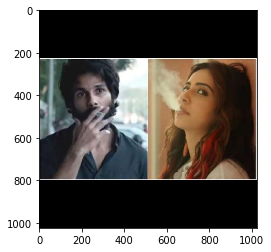

In [92]:
plt.imshow(image)

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 18)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
Objects detected:  2


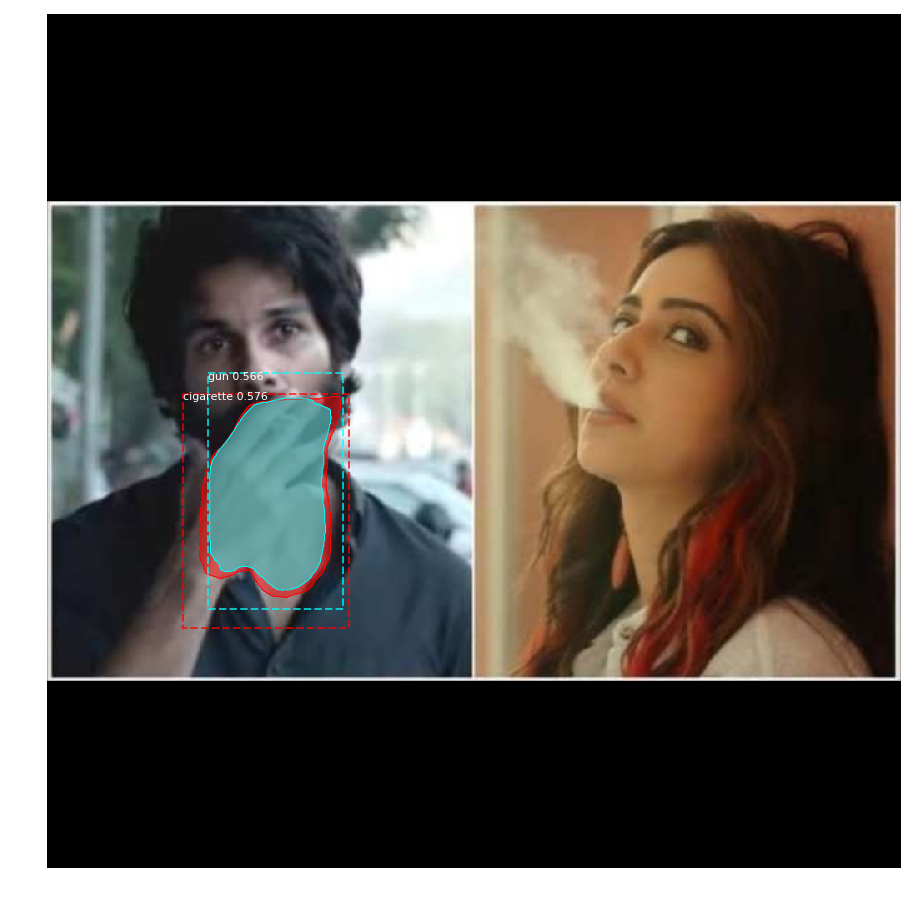

[3 5]


In [93]:
# Included in the results from detect are the found:
# class_ids,their scores and masks.
results = inf_model.detect([image], verbose=1)[0]

print("Objects detected: ", len(results['class_ids']))

# Visualize results
visualize.display_instances(image, 
                            results['rois'], 
                            results['masks'], 
                            results['class_ids'], 
                            inf_config.ALL_CLASS_NAMES, 
                            results['scores'])
print(results['class_ids'])